## 2. Vergleich Visualisierungen und EDA Airbnb NYC

In diesem Notebook werden die verschiedenen Visualisierungsmöglichkeiten mit 

- Matplotlib, 
- Seaborn, 
- Plotly, 
- Altair und 
- Bokeh 

ausprobiert und miteinander verglichen. Außerdem wird anhand verschiedener **Boxplots** getestet, wie einzelne Elemente betont werden können, um die Aufmerksamkeit zu lenken und bestimmte Botschaften zu vermitteln (Stichworte: Storytelling, Design, Cognitive Load).

Als Datengrundlage dient der Airbnb NYC Datensatz, welcher verschiedene Informationen zu Airbnb Listings in New York City enthält.

Quellen:
- https://www.data-to-viz.com/ (Sehr schön gestaltete, übersichtliche Informationsseite für die Darstellung von verschiedenen Variablen; auch für Storytelling interessant)
- Nussbaumer Knaflic, Cole: Storytelling with Data: A Data Visualization Guide for Business Professionals (2015)
- Ideen und Code wurden mit Gemini entwickelt.


#### Setup

In [46]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")

In [47]:
# 1. Datenhaltung und Basis
import pandas as pd
import numpy as np
import json
from sqlalchemy import create_engine

# 2. Statische Visualisierung (Die Klassiker)
import matplotlib.pyplot as plt
import seaborn as sns

# 3. Interaktive Visualisierung (Web-basiert)
import plotly.express as px
import plotly.graph_objects as go

# 4. Deklarative & Web-Spezialisten
import altair as alt
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap
from bokeh.palettes import Spectral6

# 5. Spezial-Tools für den "Gesundheitscheck"
import missingno as msno

# Konfiguration für die Darstellung im Notebook
%matplotlib inline
sns.set_theme(style="whitegrid") # Schöner Standard-Look für Seaborn
output_notebook() # Aktiviert die Bokeh-Anzeige direkt im Notebook-Output

print("✅ Alle Bibliotheken erfolgreich geladen!")

Loading BokehJS ...

✅ Alle Bibliotheken erfolgreich geladen!


In [48]:
df = pd.read_csv('../data/interim/nyc_airbnb_prepared_for_sql.csv')

**Leitfrage für die Visualisierungen**: "Wie variieren die Preise ('price') in den verschiedenen Stadtteilen ('neighbourhood_group_cleansed')?"

In [49]:
# Filter für bessere Sichtbarkeit in den Test-Plots
df_test = df[df['price'] <= 1000].copy()

#### 1. Matplotlib (Der Klassiker - Statisch)

Fokus: Wie viel Aufwand macht das Layout (Achsen, Rotation)?

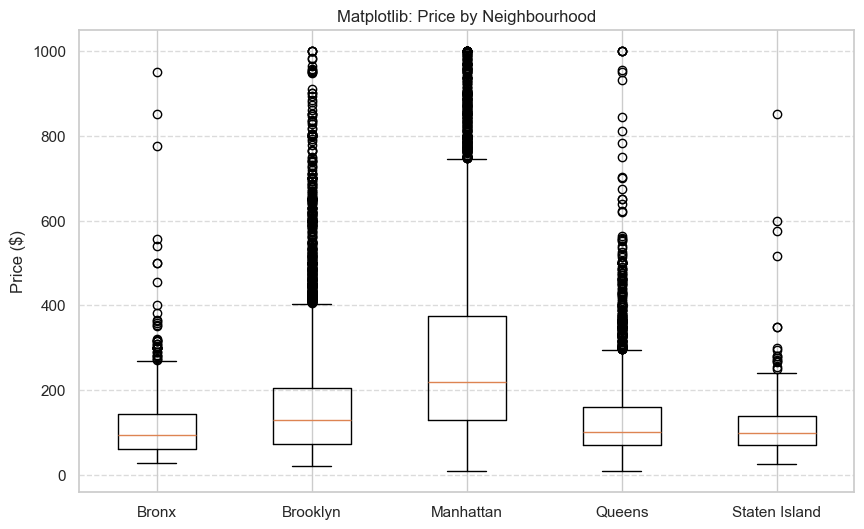

In [50]:
plt.figure(figsize=(10, 6))
groups = df_test.groupby('neighbourhood_group_cleansed')['price'].apply(list)
plt.boxplot(groups.values, tick_labels=groups.index)
plt.title('Matplotlib: Price by Neighbourhood')
plt.ylabel('Price ($)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### 2. Seaborn (Der Statistik-Profi - Statisch)

Fokus: Ästhetik und Code-Kürze

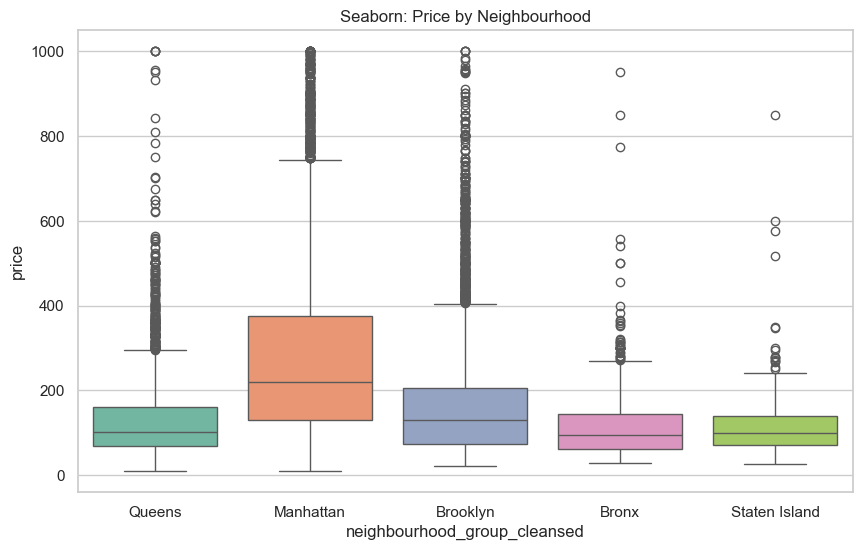

In [51]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_test, x='neighbourhood_group_cleansed', y='price', palette='Set2', hue='neighbourhood_group_cleansed', legend=False)
plt.title('Seaborn: Price by Neighbourhood')
plt.show()

#### 3. Plotly (Die Interaktive - Modern)

Fokus: Tooltips und Interaktivität

In [52]:
fig = px.box(df_test, x='neighbourhood_group_cleansed', y='price', 
             color='neighbourhood_group_cleansed',
             title='Plotly: Interaktive Preisanalyse')
fig.show()

Betonung einzelner Aspekte durch Design

In [53]:
# 1. Farbschema (wie zuvor)
highlight_map = {
    'Manhattan': '#FF5A5F',     
    'Brooklyn': '#7F7F7F',      
    'Queens': '#7F7F7F',
    'Bronx': '#7F7F7F',
    'Staten Island': '#7F7F7F'
}

# 2. Plot erstellen
fig = px.box(df_test, 
             x='neighbourhood_group_cleansed', 
             y='price', 
             color='neighbourhood_group_cleansed',
             color_discrete_map=highlight_map,
             title='Preisanalyse NYC: Fokus auf Manhattan')

# 3. Gezielte Anpassung der Schrift für Manhattan
# Wir suchen die "Trace" (Datenreihe) für Manhattan und ändern die Hover-Schriftfarbe auf Weiß
fig.update_traces(
    hoverlabel=dict(font_color="white"),
    selector=dict(name="Manhattan")
)

# 4. Layout-Anpassungen
fig.update_layout(
    xaxis_title="Stadtteil",
    yaxis_title="Preis in $",
    plot_bgcolor='white',
    showlegend=False
)

fig.show()

In [54]:
# 1. Farbschema definieren (Fokus Manhattan, Rest in kräftigerem Grau)
highlight_map = {
    'Manhattan': '#FF5A5F',     # Airbnb-Rot
    'Brooklyn': '#7F7F7F',      # Mittleres Dunkelgrau
    'Queens': '#7F7F7F',
    'Bronx': '#7F7F7F',
    'Staten Island': '#7F7F7F'
}

# 2. Plot erstellen
fig = px.box(df_test, 
             x='neighbourhood_group_cleansed', 
             y='price', 
             color='neighbourhood_group_cleansed',
             color_discrete_map=highlight_map,
             title='Preisanalyse NYC: Fokus auf Manhattan')

# 3. Design-Feinschliff
fig.update_layout(
    xaxis_title="Stadtteil",
    yaxis_title="Preis in $",
    plot_bgcolor='white',       # Weißer Hintergrund für maximale Farbwirkung
    showlegend=False
)

# Gitterlinien nur auf der Y-Achse für bessere Lesbarkeit der Preise
fig.update_yaxes(showgrid=True, gridcolor='LightGray')

fig.show()


#### 4. Altair (Die Logische - Deklarativ)

Fokus: Die klare Struktur (Data -> Mark -> Encode).

Problem: Der Datensatz ist mit über 21.000 Zeilen zu groß für die Standardeinstellungen von Altair. Die Grenze liegt standardmäßig bei 5.000 Zeilen.

Die Lösung: Für einen reinen Visualisierungs-Test reichen oft auch weniger Datenpunkte, um das Design zu beurteilen.

In [55]:
alt.Chart(df_test.sample(5000)).mark_boxplot().encode(
    x='neighbourhood_group_cleansed:N',
    y='price:Q',
    color='neighbourhood_group_cleansed:N'
).properties(width=500, title='Altair: Preisanalyse (Sample)').interactive()

alt.Chart(...)

VIEW mit Spaltenauswahl nutzen für draft analysis

In [56]:
df_view = pd.read_csv('../data/processed/airbnb_nyc_model_data.csv')

In [12]:
import altair as alt

chart = alt.Chart(df_view.sample(5000)).transform_calculate(
    region=" 'NYC Gesamt' "  # Hier erstellen wir eine virtuelle Spalte
).mark_boxplot(
    size=100, 
    extent='min-max'
).encode(
    x=alt.X('region:N', title=None), 
    y=alt.Y('price:Q', title='Preis in $', scale=alt.Scale(domain=[0, 600])),
    color=alt.value('#6A5ACD')
).properties(
    width=300,
    height=400,
    title='Preisverteilung NYC (gefiltert bis 564$)'
).interactive()

chart.show()


alt.Chart(...)

In [57]:
alt.Chart(df_view.sample(5000)).mark_boxplot().encode(
    x='neighbourhood_group_cleansed:N',
    y='price:Q',
    color='neighbourhood_group_cleansed:N'
).properties(width=500, title='Altair: Preisanalyse (Sample)').interactive()

alt.Chart(...)

### 5. Bokeh   

Bokeh ist für einen schnellen Boxplot-Test eher ungeeignet, da es eine Low-Level-Bibliothek ist und deshalb nur Bausteine für die Visualisierung bereitstellt. 

Um einen Boxplot in Bokeh zu erstellen, müsste man:

- den **Median**, die **Quartile (Q1, Q3)** und die **Whisker-Grenzen (IQR)** manuell berechnen  
- einen **Viereck-Graphen** (`p.vbar`) für die Box zeichnen  
- **Linien** (`p.segment`) für die Whisker zeichnen  
- **Kreise** (`p.circle`) für die Ausreißer hinzufügen  

Aufwand zu groß, viel Code nötig.

Idee: Interaktive Scatterplots mit sehr vielen Datenpunkten

In [58]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool

# Wir plotten Preis vs. Stadtteil als interaktiven Scatter
# Nur die benoetigten Spalten in die ColumnDataSource geben (vermeidet
# BokehUserWarning "out of range integer" durch die int64-Spalte 'id')
source = ColumnDataSource(df_view[['neighbourhood_group_cleansed', 'price']])

p = figure(x_range=df_view['neighbourhood_group_cleansed'].unique(), 
           title="Bokeh Quick-Check: Price per Neighbourhood",
           height=400, width=700, tools="pan,wheel_zoom,box_zoom,reset")

p.scatter(x='neighbourhood_group_cleansed', y='price', source=source, 
          size=5, alpha=0.2, color="navy")

# Tooltip hinzufuegen
hover = HoverTool(tooltips=[("Stadtteil", "@neighbourhood_group_cleansed"), ("Preis", "@price$")])
p.add_tools(hover)

show(p)


In [59]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool, WMTSTileSource
import numpy as np

# 1. Funktion zur Umrechnung von Grad in Web Mercator (Meter)
def lnglat_to_meters(longitude, latitude):
    origin_shift = 2 * np.pi * 6378137 / 2.0
    mx = longitude * origin_shift / 180.0
    my = np.log(np.tan((90 + latitude) * np.pi / 360.0)) / (np.pi / 180.0)
    my = my * origin_shift / 180.0
    return mx, my

# 2. Daten vorbereiten (fuer die Karte)
df_map = df.copy()
df_map['x'], df_map['y'] = lnglat_to_meters(df_map['longitude'], df_map['latitude'])

# 3. Karten-Hintergrund (OpenStreetMap)
# Wir nutzen CartoDB Positron (sehr dezent, ideal fuer Daten-Overlays)
tile_provider = WMTSTileSource(
    url='http://c.basemaps.cartocdn.com/light_all/{Z}/{X}/{Y}.png',
    attribution='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors'
)

# 4. Figure erstellen
p = figure(title="Airbnb NYC - Geografische Preisverteilung", 
           x_axis_type="mercator", y_axis_type="mercator",
           height=600, width=800,
           tools="pan,wheel_zoom,box_zoom,reset")

# Hintergrundkarte hinzufuegen
p.add_tile(tile_provider)

# 5. Datenpunkte hinzufuegen (Circles)
# Nur die benoetigten Spalten in die ColumnDataSource geben (vermeidet
# BokehUserWarning "out of range integer" durch die int64-Spalte 'id')
cols = ['x', 'y', 'price', 'room_type', 'neighbourhood_group_cleansed']
source = ColumnDataSource(df_map[cols])

p.scatter(x='x', y='y', size=4, fill_alpha=0.4, source=source,
          color="navy", line_color=None)

# 6. Interaktives Hover-Tool
hover = HoverTool(tooltips=[
    ("Preis", "@price$"),
    ("Typ", "@room_type"),
    ("Stadtteil", "@neighbourhood_group_cleansed")
])
p.add_tools(hover)

show(p)


In [60]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool, WMTSTileSource, LinearColorMapper, ColorBar
from bokeh.palettes import Viridis256, Spectral6 # Farbschemata
import numpy as np

# 1. Funktion zur Umrechnung
def lnglat_to_meters(longitude, latitude):
    origin_shift = 2 * np.pi * 6378137 / 2.0
    mx = longitude * origin_shift / 180.0
    my = np.log(np.tan((90 + latitude) * np.pi / 360.0)) / (np.pi / 180.0)
    my = my * origin_shift / 180.0
    return mx, my

# 2. Daten vorbereiten
df_map = df_test.copy() # Nutze hier deinen bereinigten Datensatz
df_map['x'], df_map['y'] = lnglat_to_meters(df_map['longitude'], df_map['latitude'])

# 3. Color Mapper definieren
# Er mappt den Preis auf eine Farbskala (Blau = guenstig, Gelb/Rot = teuer)
color_mapper = LinearColorMapper(palette=Viridis256, low=df_map.price.min(), high=564)

# 4. Figure erstellen
p = figure(title="Airbnb NYC - Preisdichte & geografische Verteilung", 
           x_axis_type="mercator", y_axis_type="mercator",
           height=700, width=900,
           tools="pan,wheel_zoom,box_zoom,reset")

# Hintergrundkarte (CartoDB Positron ist super dezent)
p.add_tile("CARTODBPOSITRON") 

# Nur die benoetigten Spalten in die ColumnDataSource geben (vermeidet
# BokehUserWarning "out of range integer" durch die int64-Spalte 'id')
cols = ['x', 'y', 'price', 'room_type', 'neighbourhood_group_cleansed']
source = ColumnDataSource(df_map[cols])

# 5. Datenpunkte hinzufuegen mit Farbmeter
p.scatter(x='x', y='y', size=4, 
          fill_alpha=0.6, 
          source=source,
          fill_color={'field': 'price', 'transform': color_mapper}, # Hier passiert die Magie
          line_color=None)

# 6. Farblegende hinzufuegen
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=12, location=(0,0), title="Preis $")
p.add_layout(color_bar, 'right')

# 7. Hover-Tool
hover = HoverTool(tooltips=[
    ("Preis", "@price$"),
    ("Stadtteil", "@neighbourhood_group_cleansed"),
    ("Zimmertyp", "@room_type")
])
p.add_tools(hover)

show(p)


Diese Karte ist geeignet für die Draft Analysis.

## 2. Explorative Datenanalyse NYC

#### Setup

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import sys
import os
from sqlalchemy import create_engine
import plotly.express as px
import json


In [62]:

df_interim = pd.read_csv('../data/interim/nyc_airbnb_prepared_for_sql.csv')
# Daten aus VIEW
df_final = pd.read_csv('../data/processed/airbnb_nyc_model_data.csv')

In [63]:
print(f"Rohdaten (interim): {df_interim.shape[0]} Zeilen")
print(f"Gefilterte Daten (view): {df_final.shape[0]} Zeilen")
print(f"Differenz (entfernte Ausreißer): {df_interim.shape[0] - df_final.shape[0]}")

Rohdaten (interim): 21328 Zeilen
Gefilterte Daten (view): 19808 Zeilen
Differenz (entfernte Ausreißer): 1520


[Data Dictionary](https://docs.google.com/spreadsheets/d/116R-QwHH8gGSLItQV7PPvEJBxDXbEOxg93yDzJYcNHY/edit?gid=0#gid=0)


### Allgemeines zu den Datensätzen

In [64]:
df_final.head()

,id,neighbourhood_group_cleansed,room_type,instant_bookable,accommodates,bathrooms,bedrooms,beds,host_total_listings_count,distance_to_center,price,ln_price
0,40824219,Queens,Private room,False,1,1.0,1.0,1.0,3.0,5.846824,66.0,4.204693
1,40839416,Manhattan,Private room,False,1,2.0,1.0,1.0,16.0,4.068795,76.0,4.343805
2,40843980,Queens,Entire home/apt,False,6,1.0,2.0,3.0,2.0,14.496832,97.0,4.584967
3,40824301,Brooklyn,Private room,False,1,1.0,2.0,1.0,1.0,6.134544,60.0,4.110874
4,40825740,Brooklyn,Entire home/apt,False,6,4.0,3.0,3.0,9.0,10.045623,425.0,6.054439


In [65]:
df_interim.head()

,id,price,accommodates,room_type,bedrooms,beds,bathrooms,neighbourhood_group_cleansed,minimum_nights,instant_bookable,review_scores_rating,host_is_superhost,host_total_listings_count,availability_365,latitude,longitude,city
0,40824219,66.0,1,Private room,1.0,1.0,1.0,Queens,30,False,4.81,True,3.0,77,40.746980,-73.917630,NYC
1,40839416,76.0,1,Private room,1.0,1.0,2.0,Manhattan,30,False,4.95,True,16.0,168,40.721470,-73.982700,NYC
2,40843980,97.0,6,Entire home/apt,2.0,3.0,1.0,Queens,30,False,4.14,True,2.0,364,40.682300,-73.845450,NYC
3,40824301,60.0,1,Private room,2.0,1.0,1.0,Brooklyn,30,False,4.92,True,1.0,187,40.713163,-73.943077,NYC
4,40825740,425.0,6,Entire home/apt,3.0,3.0,4.0,Brooklyn,30,False,5.00,False,9.0,224,40.674120,-73.941230,NYC


In [66]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19808 entries, 0 to 19807
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            19808 non-null  int64  
 1   neighbourhood_group_cleansed  19808 non-null  object 
 2   room_type                     19808 non-null  object 
 3   instant_bookable              19808 non-null  bool   
 4   accommodates                  19808 non-null  int64  
 5   bathrooms                     19801 non-null  float64
 6   bedrooms                      19722 non-null  float64
 7   beds                          19768 non-null  float64
 8   host_total_listings_count     18907 non-null  float64
 9   distance_to_center            19808 non-null  float64
 10  price                         19808 non-null  float64
 11  ln_price                      19808 non-null  float64
dtypes: bool(1), float64(7), int64(2), object(2)
memory usage: 1.

In [67]:
df_final[['price', 'ln_price', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'host_total_listings_count', 'distance_to_center']].describe()

,price,ln_price,accommodates,bathrooms,bedrooms,beds,host_total_listings_count,distance_to_center
count,19808.000000,19808.000000,19808.000000,19801.000000,19722.000000,19768.000000,18907.000000,19808.000000
mean,179.059673,4.965717,2.693811,1.153528,1.307778,1.569000,153.211086,8.168982
std,122.497186,0.688534,1.738030,0.461184,0.912971,1.053193,656.579760,5.558606
min,10.000000,2.397895,1.000000,0.000000,0.000000,0.000000,1.000000,0.013191
25%,85.000000,4.454347,2.000000,1.000000,1.000000,1.000000,2.000000,3.758194
50%,145.000000,4.983607,2.000000,1.000000,1.000000,1.000000,5.000000,7.745291
75%,240.000000,5.484797,4.000000,1.000000,2.000000,2.000000,21.000000,11.228109
max,564.000000,6.336826,16.000000,10.500000,9.000000,16.000000,6815.000000,35.920435


In [68]:
df_model = df_final[['price', 'ln_price', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'host_total_listings_count', 'distance_to_center']].copy()

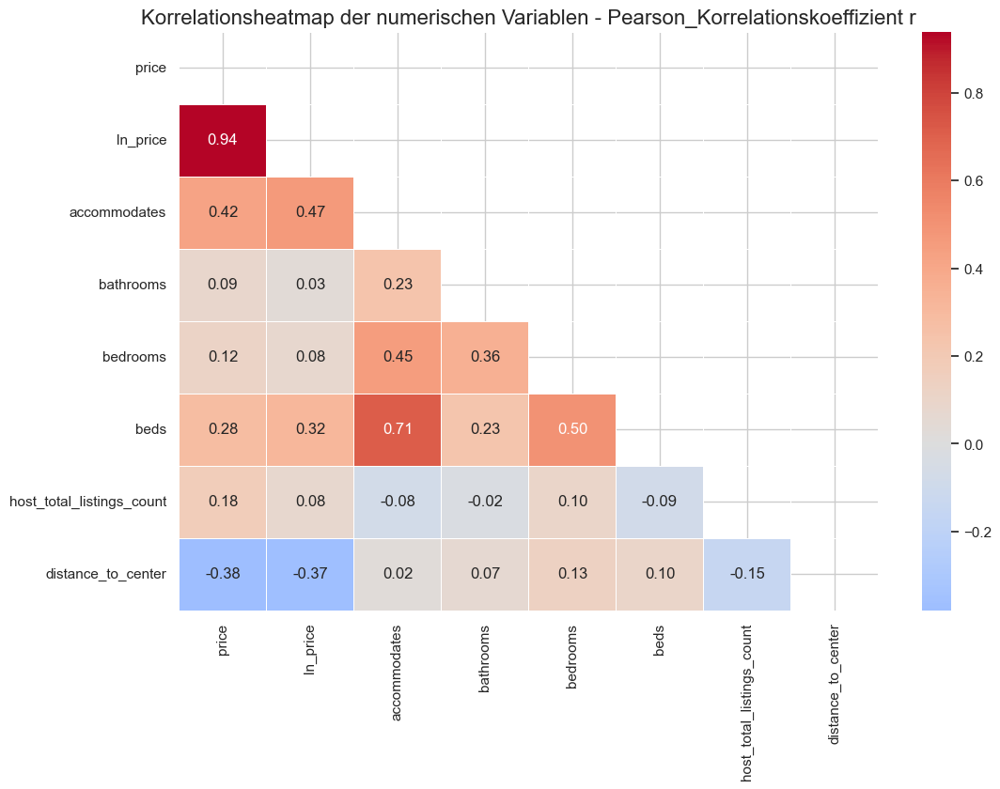

In [26]:
# Korrelationsmatrix berechnen
corr_matrix = df_model.corr()

# Maske für das obere Dreieck erstellen (optional, macht es übersichtlicher)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Plot erstellen
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, 
            mask=mask, 
            annot=True,          # Zahlen in die Kästchen schreiben
            fmt=".2f",           # 2 Nachkommastellen
            cmap='coolwarm',     # Farbskala von Blau (negativ) zu Rot (positiv)
            center=0,            # Weiß bei 0 Korrelation
            linewidths=.5)

plt.title('Korrelationsheatmap der numerischen Variablen - Pearson_Korrelationskoeffizient r', fontsize=16)
plt.show()

Ausreißer beachten: ln-Transformation des Preises könnte helfen, die Korrelationen zu verbessern.

### 2.1 Zielvariable Preis ('price')

Boxplot 'Price'

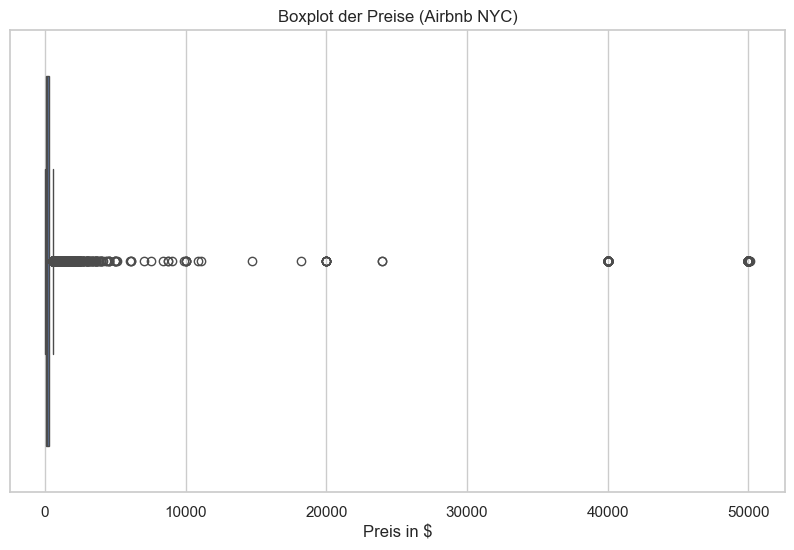

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot erstellen
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['price'])

plt.title('Boxplot der Preise (Airbnb NYC)')
plt.xlabel('Preis in $')
plt.show()

### Was bedeuten die Zahlen 2, 4, 6, 8?

Es handelt sich um eine **logarithmische Skala**. Um wieder auf den **tatsächlichen Dollar-Wert** zu kommen, muss die **Umkehrfunktion** der Log-Transformation angewendet werden, also die Exponentialfunktion:

$$
\text{price} = e^{\text{ln\_price}}
$$

Konkret bedeutet das:

- $2 \;\rightarrow\; e^2 \approx 7.40\ \text{\$}$
- $4 \;\rightarrow\; e^4 \approx 54.60\ \text{\$}$
- $6 \;\rightarrow\; e^6 \approx 403.40\ \text{\$}$
- $8 \;\rightarrow\; e^8 \approx 2{,}981.00\ \text{\$}$

Die Abstände auf der logarithmischen Skala sind **gleich groß**,  
auf der Originalskala wachsen die Preise jedoch **exponentiell**.


In [70]:
fig = px.box(df, 
             y='price', 
             title='Globaler Boxplot: Preisanalyse mit ln_price',
             points="outliers") # Zeigt die Ausreißer als Punkte an
fig.show()

In [71]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Subplot-Layout erstellen (1 Zeile, 2 Spalten)
fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=("Rohdaten: Original Price (ungefiltert)", 
                                    "Modell-Daten: ln_price (gefiltert & Log)"))

# 2. Linker Plot: Originalpreise aus den Rohdaten
fig.add_trace(
    go.Box(y=df_interim['price'], name="Price (Raw)", boxpoints="outliers", marker_color='indianred'),
    row=1, col=1
)

# 3. Rechter Plot: Log-Preise aus deiner finalen VIEW
fig.add_trace(
    go.Box(y=df_final['ln_price'], name="ln_price (Final)", boxpoints="outliers", marker_color='lightseagreen'),
    row=1, col=2
)

# 4. Optik anpassen
fig.update_layout(
    title_text="Vergleich der Preisverteilung: Vor und nach der Aufbereitung",
    showlegend=False,
    height=500
)

# WICHTIG: Die 1737$ Grenze als visuelle Linie im linken Plot einfügen
fig.add_hline(y=1737, line_dash="dash", line_color="black", 
              annotation_text="Cut-off: 1737$", row=1, col=1)

fig.show()

In [72]:
# 1. Berechnung der statistischen Grenze
Q1 = df_interim['price'].quantile(0.25)
Q3 = df_interim['price'].quantile(0.75)
IQR = Q3 - Q1
upper_whisker = Q3 + 1.5 * IQR

# 2. Zählen, wie viele Zeilen übrig bleiben
total_count = len(df_interim)
kept_count = len(df_interim[df_interim['price'] <= upper_whisker])
percent_kept = (kept_count / total_count) * 100

print(f"Statistische Grenze (Upper Whisker): {upper_whisker:.2f} $")
print(f"Datensätze im Modell: {kept_count} von {total_count}")
print(f"Das entspricht: {percent_kept:.2f} % der Daten")

Statistische Grenze (Upper Whisker): 564.00 $
Datensätze im Modell: 19808 von 21328
Das entspricht: 92.87 % der Daten


In [73]:
import numpy as np

preisgrenze = round(np.exp(7.46), 0)
print("Preis am oberen Whisker (in Dollar):", preisgrenze)


Preis am oberen Whisker (in Dollar): 1737.0


In [74]:
# Filtern basierend auf dem Log-Wert
df_filtered = df[df['price'] <= 7.46].copy()


# Check: Wie viele Zeilen wurden entfernt?
print(f"Daten vorher: {len(df)}")
print(f"Daten nach Filter: {len(df_filtered)}")
print(f"Entfernte Ausreißer: {len(df) - len(df_filtered)}")

Daten vorher: 21328
Daten nach Filter: 0
Entfernte Ausreißer: 21328


**Definition des "Mainstream"-Marktes**:

Alle Beobachtungen oberhalb von 7.46 gelten nach der Boxplot-Definition (e^7.46 \approx 1{,}740)
(i. d. R. Q3+1.5⋅IQR) als Ausreißer

Diese Werte werden im Boxplot nicht mehr als „typisch“ dargestellt

**Auswahl der Features:**

accommodates, minimum nights, host_total_listings_count, bedrooms, 



------------------------------------------------------------

### Multikolinearität untersuchen durch VIF

Was ist die VIF-Analyse? (Variance Inflation Factor)

Der VIF ist die Kennzahl für Multikollinearität. Er sagt dir nicht nur, ob zwei Variablen korrelieren, sondern ob eine Variable durch alle anderen Variablen zusammen "ersetzt" werden könnte.

    Stell dir vor: Du hast ein Team von Bauarbeitern. Wenn einer krank wird und die anderen drei seine Arbeit komplett mitmachen können, ohne dass es auffällt, dann hat dieser Arbeiter eine hohe "Redundanz" (hoher VIF).

    Der Wert:

        VIF = 1: Keine Korrelation (Super!).

        VIF 1 bis 5: Moderate Korrelation (Völlig okay).

        VIF > 5 oder 10: Kritisch. Das Modell "weiß" nicht mehr, welcher Koeffizient zu welcher Variable gehört. Die Ergebnisse werden unzuverlässig.


**WICHTIG:** VIF benötigt vollständige Zeilen (keine NaNs). Deshalb erst VIEW, dann split (Training/Test), dann Imputation und VIF, dann Feature Engineering

#### 3.1 Data Import & SQL-Preparation
Bevor die Daten in Python geladen wurden, wurde eine SQL-View in PostgreSQL erstellt, um die Feature-Selection und Distanzberechnungen durchzuführen.

```sql
CREATE VIEW vw_airbnb_model_data AS
SELECT 
    id,
    neighbourhood_group_cleansed,
    room_type,
    instant_bookable,
    accommodates,
    bathrooms,
    bedrooms,
    beds,
    host_total_listings_count,
    -- Berechnung der Distanz zum Times Square (Haversine-Formel)
    (6371 * acos(
        cos(radians(40.7580)) * cos(radians(latitude)) * cos(radians(longitude) - radians(-73.9855)) + 
        sin(radians(40.7580)) * sin(radians(latitude))
    )) AS distance_to_center,
    price,
    LN(price + 1) AS ln_price
FROM nyc_airbnb_listings_raw
WHERE price > 0 
  AND price <= 1737;
```

#### 1. Numerische Analyse: Skewness & Kurtosis

Die Skewness (Schiefe) sollte idealerweise nahe 0 sein. Die Kurtosis (Wölbung) sagt aus, wie "steil" oder "flach" die Verteilung ist (Vergleich mit Normalverteilung).

In [75]:
from scipy.stats import skew, kurtosis

# Berechnung für Originalpreis vs. ln_price
for col in ['price', 'ln_price']:
    s = skew(df_final[col].dropna())
    k = kurtosis(df_final[col].dropna())
    print(f"{col}: Skewness = {s:.2f}, Kurtosis = {k:.2f}")

price: Skewness = 1.11, Kurtosis = 0.54
ln_price: Skewness = -0.05, Kurtosis = -0.76


#### 2. Visuelle Analyse: Der Q-Q Plot

Der Q-Q Plot (Quantile-Quantile) vergleicht die Verteilung der Daten mit einer perfekten Normalverteilung. Je näher die Punkte an der diagonalen Linie liegen, desto besser eignet sich die Variable für lineare Modelle.

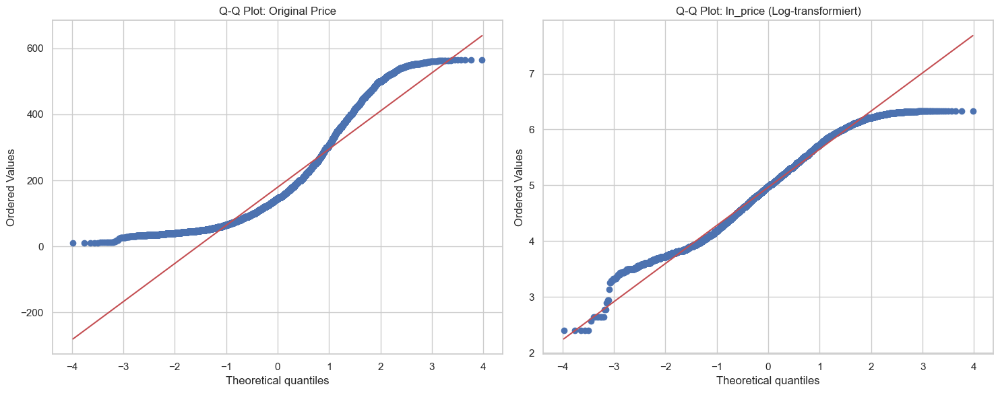

In [76]:
import scipy.stats as stats
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Q-Q Plot für Original Price
stats.probplot(df_final['price'], dist="norm", plot=axes[0])
axes[0].set_title('Q-Q Plot: Original Price')

# Q-Q Plot für ln_price
stats.probplot(df_final['ln_price'], dist="norm", plot=axes[1])
axes[1].set_title('Q-Q Plot: ln_price (Log-transformiert)')

plt.tight_layout()
plt.show()

### 2.3 Numerische Variablen

Bei der Regression ist die Beziehung der Features untereinander genauso wichtig wie die zum Preis. ABER: Scatterplots bei 21.000 Datenpunkten leiden oft unter "Overplotting" (man sieht nur einen schwarzen/blauen Klumpen) 
Idee: 2D-Density Plots

### 2.4 Geodaten und Feature Engineering

Die Idee mit der "Distance to Center" (z.B. Times Square oder Empire State Building) ist ein Hebel für die Modellgüte.

Weitere Idee: In NYC ist nicht nur die Entfernung zum Zentrum, sondern auch die Anbindung an den ÖPNV (Distance to nearest Subway Station) oft ein Preistreiber. Falls die passenden Daten nicht vorhanden sind, bleibt die "Distance to Center" der stärkste Proxy.
Visualisierung: Karte mit Farbskala (Colormap), die den Preis darstellt (z.B. viridis oder hot).

### 2.5 Outlier Treatment

Da eine lineare Regression geplant ist, sollten extreme Ausreißer im Preis entfernt werden, da sie die Modellgüte stark beeinträchtigen können. Deshab wird definiert, was ein "unrealistischer" Preis ist (z.B. 0$ oder 10.000$). Mit der Interquartilsabstands-Methode (IQR) sollen diese Ausreißer identifiziert und entfernt werden.